## $$\textbf{MAIN STUDY}$$

In [ ]:
# Package installation, only if they are not installed previously

!pip3 install numpy
!pip3 install pandas
!pip3 install astropy
!pip3 install matplotlib
!pip3 install seaborn
!pip3 install scikit-learn

In [1]:
# We import those packages used for the study

import pandas as pd
import pandas.plotting as pdplt
import numpy as np
import astropy as ast
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

matplotlib.rcdefaults()

In [2]:
# We load the datasets for the specified redshift values

df_mass = pd.read_csv("EGS_stellar_mass_noon.csv")
df_mass = df_mass[df_mass > -90]

df_phys = pd.read_csv("EGS_physical_properties_noon.csv")
df_phys = df_phys[df_phys > -90]

df_reds = pd.read_csv("EGS_redshift_noon.csv")

df_mult = pd.read_csv("EGS_multiband_noon.csv")


---

### $$\text{CHARACTERIZATION OF THE DATA}$$

We study which of these properties we should use for this study case:

SFR:

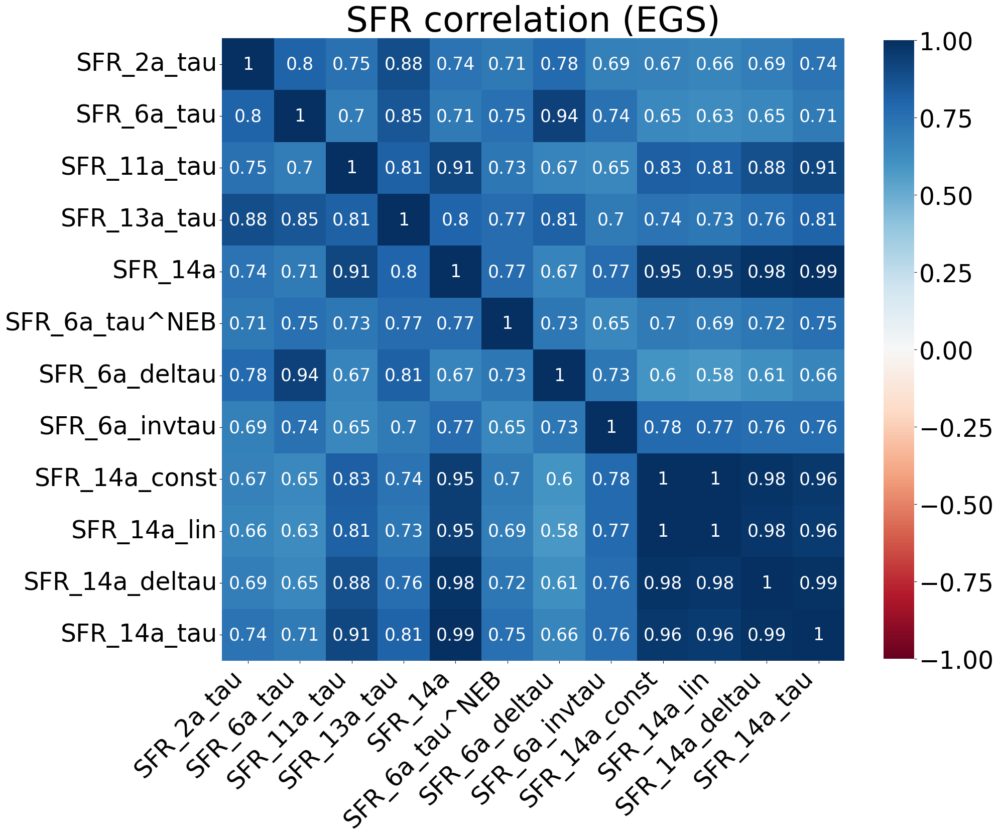

In [4]:
df_SFR = df_phys[['SFR_2a_tau', 'SFR_6a_tau', 'SFR_11a_tau', 'SFR_13a_tau', 'SFR_14a', 'SFR_6a_tau^NEB', 'SFR_6a_deltau', 'SFR_6a_invtau', 'SFR_14a_const', 'SFR_14a_lin', 'SFR_14a_deltau', 'SFR_14a_tau']]

matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 


corr_matrix = df_SFR.corr(method='spearman')

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))

ax = sns.heatmap(
    corr_matrix,
    annot     = True,
    cbar      = True,
    annot_kws = {"size": 25},
    vmin      = -1,
    vmax      = 1,
    center    = 0,
    cmap      = 'RdBu',
    cbar_kws={"shrink": .8},
    square    = True,
    ax        = ax
)

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=35)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation = 0,
)

plt.title('SFR correlation (EGS)', fontsize = 50)


ax.tick_params(labelsize = 35)

del fig, ax, df_SFR, corr_matrix, cbar

matplotlib.rcdefaults()

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


<Figure size 1000x1000 with 0 Axes>

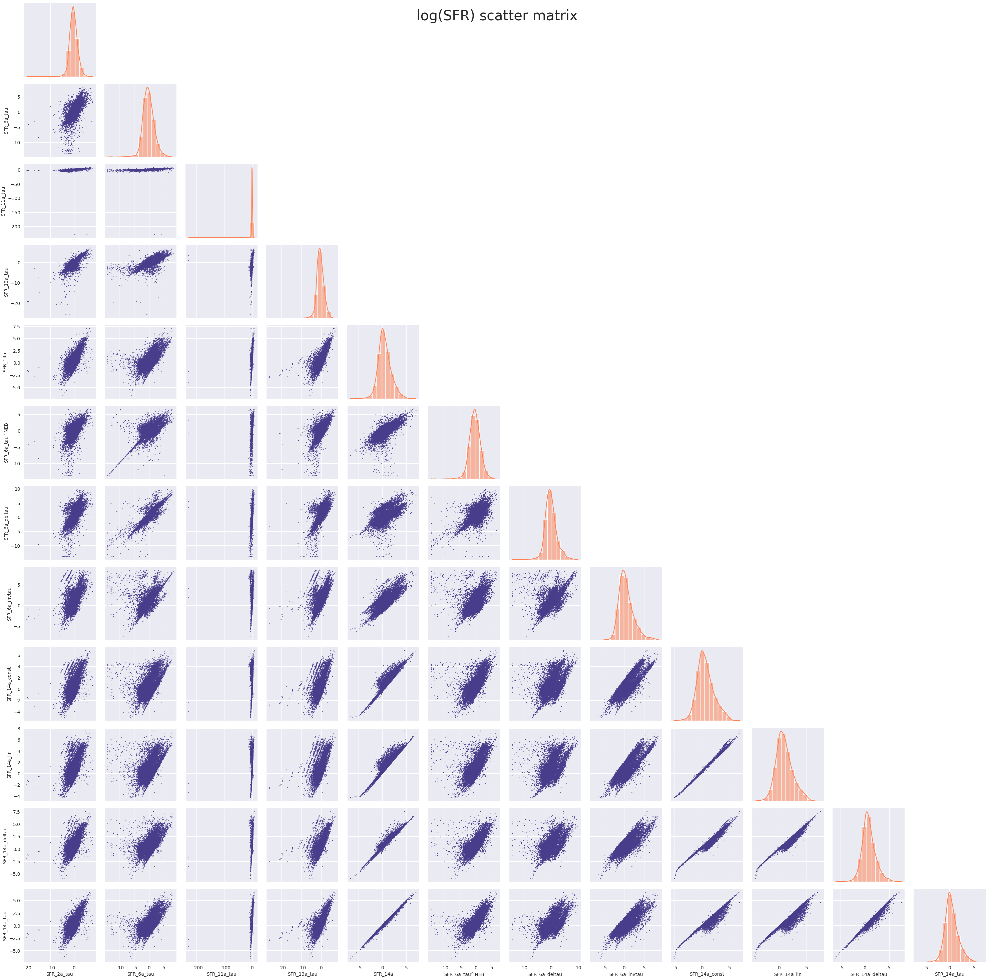

In [5]:
df_logSFR = np.log(df_phys[['SFR_2a_tau', 'SFR_6a_tau', 'SFR_11a_tau', 'SFR_13a_tau', 'SFR_14a', 'SFR_6a_tau^NEB', 'SFR_6a_deltau', 'SFR_6a_invtau', 'SFR_14a_const', 'SFR_14a_lin', 'SFR_14a_deltau', 'SFR_14a_tau']])

sns.set_style("darkgrid")
plt.figure(figsize = (10, 10))
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 

SFR_mat = sns.PairGrid(df_logSFR, diag_sharey = False, corner = True)

SFR_mat.map_diag(sns.histplot, kde=True, color = 'coral', bins = 15)
SFR_mat.map_lower(sns.scatterplot, marker = "o", s = 3, edgecolor = 'none', color = 'darkslateblue')
SFR_mat.add_legend()
SFR_mat.fig.suptitle('log(SFR) scatter matrix', fontsize = 30)

del df_logSFR, SFR_mat

matplotlib.rcdefaults()

Masa:

In [5]:
df_mass_2 = df_mass.drop(['ID', 'RAdeg', 'DECdeg','q_zspec', 'r_zspec', 'Hmag', 'PhotFlag', 'Class_star', 'GNflag', 'zphot', 'zspec', 'zbest', 'zphot_l68', 'zphot_u68', 'zphot_l95', 'zphot_u95', 'zAGN', 's_neb_med', 's_med', 's_neb_med_lin', 's_med_lin'], axis = 1)
df_mass_2 = df_mass_2[df_mass_2['M_2a_tau'] > 1]
df_mass_2.describe()


,M_neb_med,M_med,M_14a_cons,M_11a_tau,M_6a_tau^NEB,M_13a_tau,M_12a_tau,M_6a_tau,M_2a_tau,M_15a,M_10c,M_14a_lin,M_14a_deltau,M_14a_tau,M_14a_inctau,M_14a,M_neb_med_lin,M_med_lin
count,14812.000000,14812.000000,14624.000000,14812.000000,14809.000000,14812.000000,14812.000000,14809.000000,14812.000000,14798.000000,14806.000000,14637.000000,14314.000000,14460.000000,14587.000000,14392.000000,14812.000000,14812.000000
mean,8.672883,8.810082,8.572072,8.795529,8.636812,8.889921,8.738623,8.756515,8.950986,8.749905,8.527813,8.452964,8.488732,8.594955,8.532739,8.548868,8.720572,8.825469
std,0.795694,0.742400,0.719156,0.789781,0.893125,0.734971,0.734983,0.771785,0.827430,0.745741,0.996175,0.727594,0.719224,0.707834,0.721668,0.715968,0.773549,0.740617
min,5.160000,5.030000,6.370000,3.330000,5.480000,4.890000,4.910000,5.480000,4.540000,5.210000,3.000000,6.380000,6.370000,6.370000,6.370000,6.370000,5.270000,5.080000
25%,8.170000,8.360000,8.090000,8.350000,8.110000,8.450000,8.300000,8.300000,8.440000,8.290000,7.960000,7.960000,8.000000,8.120000,8.040000,8.070000,8.240000,8.380000
50%,8.600000,8.750000,8.480000,8.750000,8.640000,8.830000,8.700000,8.710000,8.960000,8.690000,8.580000,8.360000,8.410000,8.510000,8.440000,8.480000,8.650000,8.770000
75%,9.100000,9.180000,8.990000,9.190000,9.140000,9.260000,9.110000,9.150000,9.430000,9.130000,9.120000,8.890000,8.930000,9.020000,8.960000,8.980000,9.130000,9.200000
max,11.500000,11.600000,11.300000,11.640000,11.570000,13.500000,11.430000,11.670000,11.870000,11.460000,11.520000,11.110000,11.250000,11.380000,11.200000,11.380000,11.600000,11.600000


In [6]:
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10) 

corr_matrix = df_mass_2.corr(method='spearman')

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(30, 30))

ax = sns.heatmap(
    corr_matrix,
    annot     = True,
    cbar      = True,
    annot_kws = {"size": 25},
    vmin      = -1,
    vmax      = 1,
    center    = 0,
    #cmap      = sns.diverging_palette(20, 220, n=200),
    cmap      = 'RdBu',
    cbar_kws={"shrink": .8},
    square    = True,
    ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation = 0,
)

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=45)

plt.title('Stellar mass correlation (EGS)', fontsize = 75)


ax.tick_params(labelsize = 40)

del fig, ax, corr_matrix

matplotlib.rcdefaults()


NameError: name 'df_mass_2' is not defined

<Figure size 1000x1000 with 0 Axes>

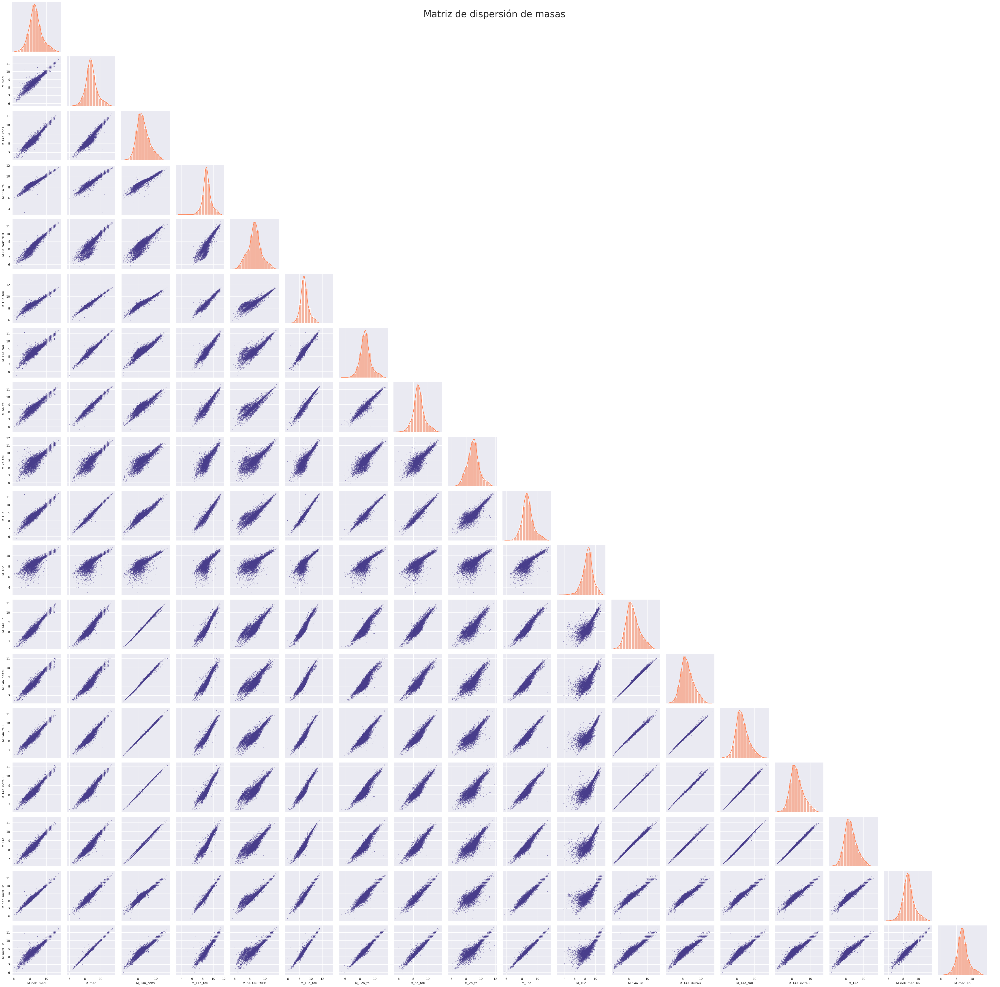

In [59]:
sns.set_style("darkgrid")
plt.figure(figsize = (10, 10))
matplotlib.rc('xtick', labelsize=10) 
matplotlib.rc('ytick', labelsize=10)

df_mass_2 = df_mass_2[df_mass_2['M_2a_tau'] > 1]
df_mass_good = df_mass_2[df_mass_2 > -90]


mass_mat = sns.PairGrid(df_mass_good, diag_sharey = False, corner = True)

mass_mat.map_diag(sns.histplot, kde=True, color = 'coral', bins = 15)
mass_mat.map_lower(sns.scatterplot, marker = "o", s = 1, edgecolor = 'none', color = 'darkslateblue')
mass_mat.add_legend()
mass_mat.fig.suptitle('Stellar mass scatter matrix', fontsize = 30)

del mass_mat, df_mass_good

matplotlib.rcdefaults()

Visual magnitude:

In [18]:
df_mags_v = df_phys[['VMag_6a_tau', 'VMag_6a_tau^NEB', 'VMag_6a_deltau', 'VMag_6a_invtau']]
df_mags_v.describe()

,VMag_6a_tau,VMag_6a_tau^NEB,VMag_6a_deltau,VMag_6a_invtau
count,15146.000000,15146.000000,15146.000000,15146.000000
mean,-18.851004,-18.872529,-18.848577,-18.866517
std,1.560054,1.555584,1.560183,1.546080
min,-24.750000,-24.750000,-24.680000,-24.640000
25%,-19.850000,-19.870000,-19.850000,-19.860000
50%,-18.710000,-18.730000,-18.700000,-18.730000
75%,-17.860000,-17.870000,-17.850000,-17.880000
max,-10.190000,-10.220000,-10.140000,-10.200000


---

From these results we can begin to study the different relationships:

The distribution of the data has been studied in another notebook

In [16]:
redshift = df_reds[["z_best"]]
redshift.columns = ['Redshift']

masa = df_mass[['M_neb_med']]
masa.columns = ['log(Masa)']

#masa_phys = df_phys[['M_l99_11a_tau']]
#masa_phys.columns = ['log(M/M_sun)']

Mag_abs_U = df_phys[['UMag_6a_tau^NEB']]
Mag_abs_U.columns = ['$\mathregular{M_U}$']

Mag_abs_B = df_phys[['BMag_6a_tau^NEB']]
Mag_abs_B.columns = ['$\mathregular{M_B}$']

Mag_abs_V = df_phys[['VMag_6a_tau^NEB']]
Mag_abs_V.columns = ['$\mathregular{M_V}$']

Mag_abs_R = df_phys[['RMag_6a_tau^NEB']]
Mag_abs_R.columns = ['$\mathregular{M_R}$']

Mag_abs_I = df_phys[['IMag_6a_tau^NEB']]
Mag_abs_I.columns = ['$\mathregular{M_I}$']

Mag_abs_J = df_phys[['JMag_6a_tau^NEB']]
Mag_abs_J.columns = ['$\mathregular{M_J}$']

Mag_abs_K = df_phys[['KMag_6a_tau^NEB']]
Mag_abs_K.columns = ['$\mathregular{M_K}$']

U_B = pd.DataFrame(df_phys['UMag_6a_tau^NEB'] - df_phys['BMag_6a_tau^NEB'])
U_B.columns = ['(U-B)']

B_V = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
B_V.columns = ['(B-V)']

U_R = pd.DataFrame(df_phys['UMag_6a_tau^NEB'] - df_phys['RMag_6a_tau^NEB'])
U_R.columns = ['(U-R)']

Age = df_phys[['age_14a']]
Age.columns = ['Edad']

SFR = np.log10(df_phys[['SFR_14a']])
SFR.columns = ['log(SFR)']

isoarea = np.log(df_mult[['ISOAREAF_IMAGE']])
isoarea.columns = ['log(isoarea)']

datos_1 = pd.concat([redshift, masa, Mag_abs_U, Mag_abs_B, Mag_abs_V, Mag_abs_R, Mag_abs_I, Mag_abs_J, Mag_abs_K, U_B, B_V, U_R, Age, SFR, isoarea], axis = 1)

In [7]:

matplotlib.rc('xtick', labelsize=30) 
matplotlib.rc('ytick', labelsize=30) 


corr_matrix = datos_1.corr(method='kendall')

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(20, 20))

sns.heatmap(
    corr_matrix,
    annot     = True,
    cbar      = True,
    annot_kws = {"size": 18},
    vmin      = -1,
    vmax      = 1,
    center    = 0,
    #cmap      = sns.diverging_palette(20, 220, 150, 40, 1, as_cmap= True),
    cmap      = 'RdBu',
    cbar_kws={"shrink": .8},
    square    = True,
    ax        = ax
)

ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation = 45,
    horizontalalignment = 'right',
)

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation = 0,
)

#plt.title('Correlación de datos del catálogo EGS', fontsize = 35)
plt.figtext(0.43, 0.84, 'EGS data correlation matrix', ha="center", fontsize=40)


ax.tick_params(labelsize = 30)

#del fig, ax, corr_matrix, redshift, masa, masa_phys, Mag_abs_U, Mag_abs_B, Mag_abs_V, Mag_abs_R, Mag_abs_I, Mag_abs_J, Mag_abs_K, SFR, U_B, B_V, U_R, isoarea, datos_1

matplotlib.rcdefaults()

NameError: name 'datos_1' is not defined

<Figure size 3000x3000 with 0 Axes>

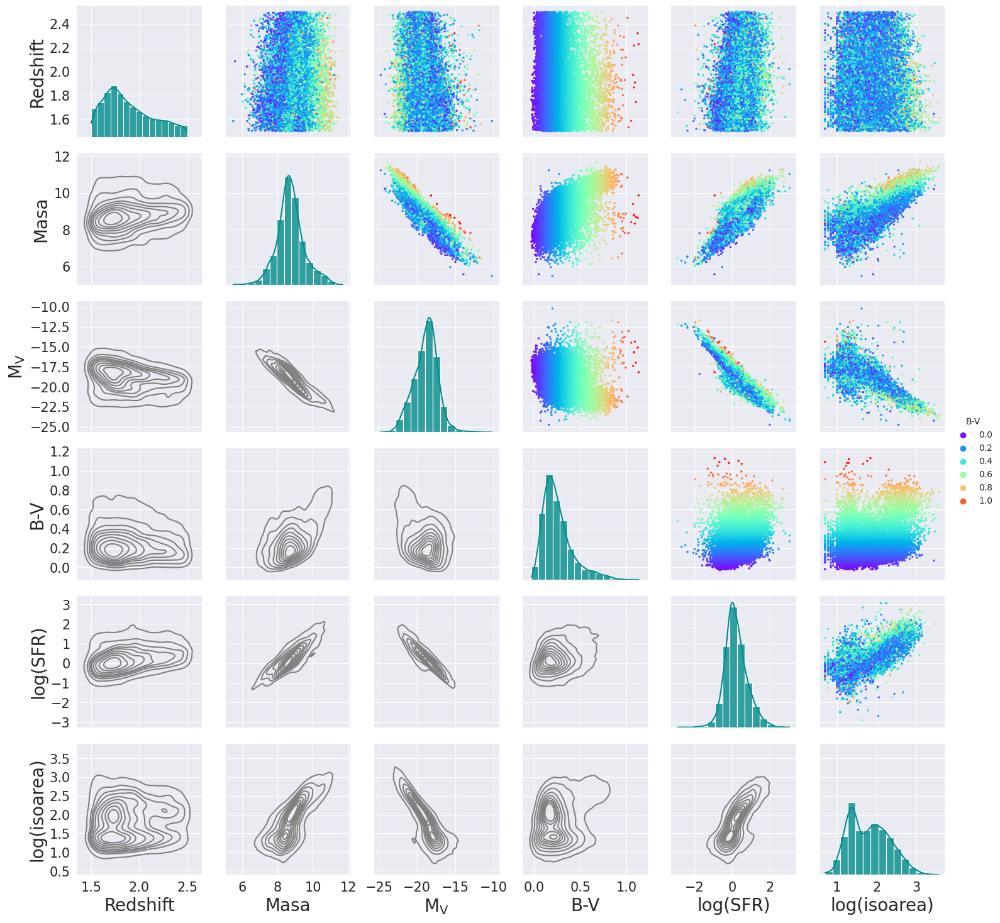

In [4]:
# Seleccionamos unas propiedades galácticas interesantes para el estudio

# Redshift
redshift = df_reds[["z_best"]]
redshift.columns = ['Redshift']

# Masa estelar
masa = df_mass[['M_6a_tau']]
masa.columns = ['Masa']

# Magnitud absoluta visual
mag_abs = df_phys[['VMag_6a_tau^NEB']]
mag_abs.columns = ['$\mathregular{M_V}$']

# Índice de color B-V
color_BV = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
color_BV.columns = ['B-V']

# Tasa de formación estelar
SFR = np.log10(df_phys[['SFR_14a']])
SFR.columns = ['log(SFR)']

# Área isofotal
isoarea = np.log10(df_mult[['ISOAREAF_IMAGE']])
isoarea.columns = ['log(isoarea)']

# Concadenamos estos dataframes en uno sólo, para su análisis
df_test = pd.concat([redshift, masa, mag_abs, color_BV, SFR, isoarea], axis = 1)

# Establecemos el estilo y propiedades de la representación
sns.set_style("darkgrid")
#sns.set_context('talk')
plt.figure(figsize = (30, 30))
matplotlib.rc('xtick', labelsize=15) 
matplotlib.rc('ytick', labelsize=15)
matplotlib.rcParams['axes.labelsize'] = 20
# Hacemos el plot en una matriz
pp = sns.PairGrid(df_test)

pp.map_lower(sns.kdeplot, fill=False, color = 'gray')
pp.map_diag(sns.histplot, kde=True, color = 'darkcyan', bins = 15, alpha = 0.8)
pp.map_upper(sns.scatterplot, data = df_test, marker = "o", s = 6, edgecolor = 'none', hue = 'B-V', palette = sns.color_palette('rainbow', as_cmap= True), alpha = 1)
pp.add_legend(title = 'B-V')

# Borramos de la memoria todos los datos hechos para esta tarea
del redshift, masa, mag_abs, color_BV, SFR, isoarea, df_test, pp

# Reestablecemos los ajustes modificados
matplotlib.rcdefaults()

$\text{A partir de los datos que hemos podido sacar de aquí, podemos buscar relaciones más detalladas}$

SFR frente a Masa

/var/folders/23/ld36njk96dbdd9x99njgz7kc0000gn/T/ipykernel_13368/4015155109.py:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = ax.figure.colorbar(sm, label = 'B-V')


pendiente: 0.7121825499536533 +/- 0.003246151236447731
intersección: -5.915585704390347 +/- 0.02803600356641275


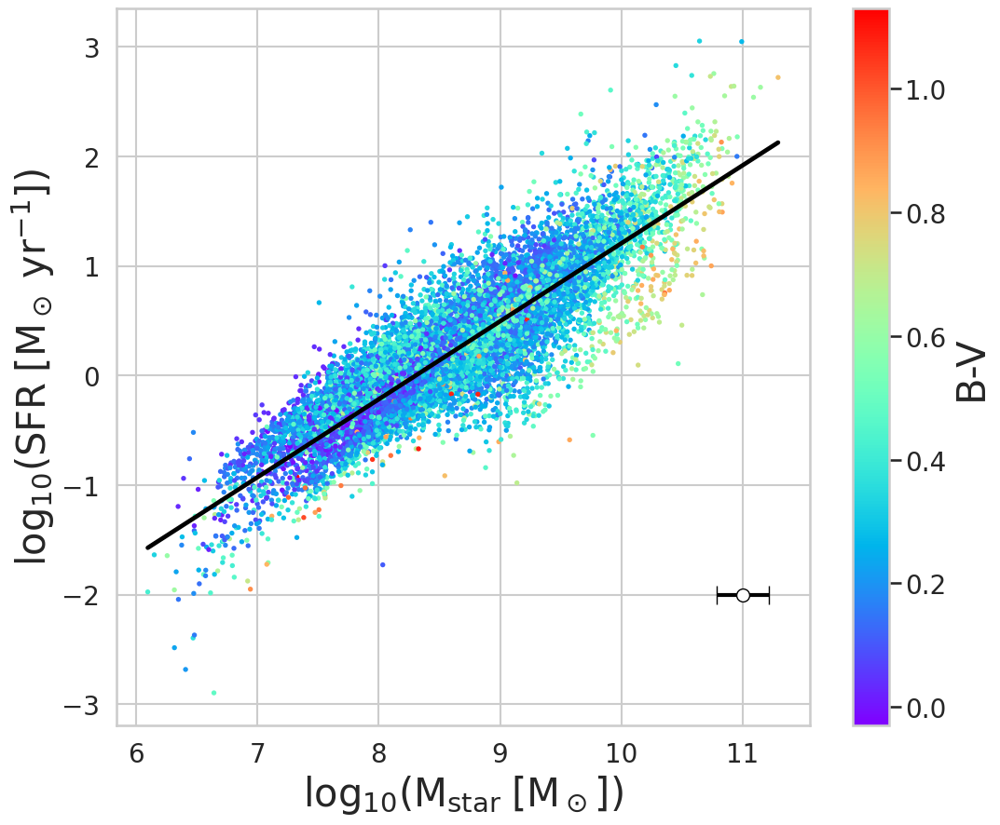

In [9]:
plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

x = pd.DataFrame(df_mass["M_neb_med"])
x.columns = ['log(M)']
y = pd.DataFrame(df_phys["SFR_14a"])
y.columns = ['log(SFR)']
z = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
z.columns = ['B-V']

y = y[y > -90]
y = np.log10(y)

ax = sns.scatterplot(x = x['log(M)'], y = y['log(SFR)'], s = 15, edgecolor = 'none', data = z, hue = 'B-V', palette = 'rainbow')
sns.regplot(x = x['log(M)'], y = y['log(SFR)'], scatter=False, ax=ax, color = 'k')

plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)


df_test2 = pd.concat([x, y], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['log(M)'])#.reshape((-1, 1))
y2 = np.array(df_test2['log(SFR)'])

p, V = np.polyfit(x2, y2, 1, cov=True)

print("pendiente: {} +/- {}".format(p[0], np.sqrt(V[0][0])))
print("intersección: {} +/- {}".format(p[1], np.sqrt(V[1][1])))

serr = df_mass['s_neb_med'].mean()
eb = plt.errorbar(x = 11, y = -2, xerr = serr, yerr = 0, ls = 'none', linewidth = 3, ecolor = 'black', capsize=7, zorder = 1)
eb2 = plt.scatter(x = 11, y = -2, color = 'white', edgecolors='black', linewidths=1, s = 100)

plt.xlabel('$\mathregular{log_{10}(M_{star} \; [M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR \; [M_\odot \; yr^{-1}])}$', size = 30)

del x, y, z
matplotlib.rcdefaults()

/var/folders/23/ld36njk96dbdd9x99njgz7kc0000gn/T/ipykernel_13368/2186710009.py:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = ax.figure.colorbar(sm, label = 'redshift')


pendiente: 0.7121825499536533 +/- 0.003246151236447731
intersección: -5.915585704390347 +/- 0.02803600356641275


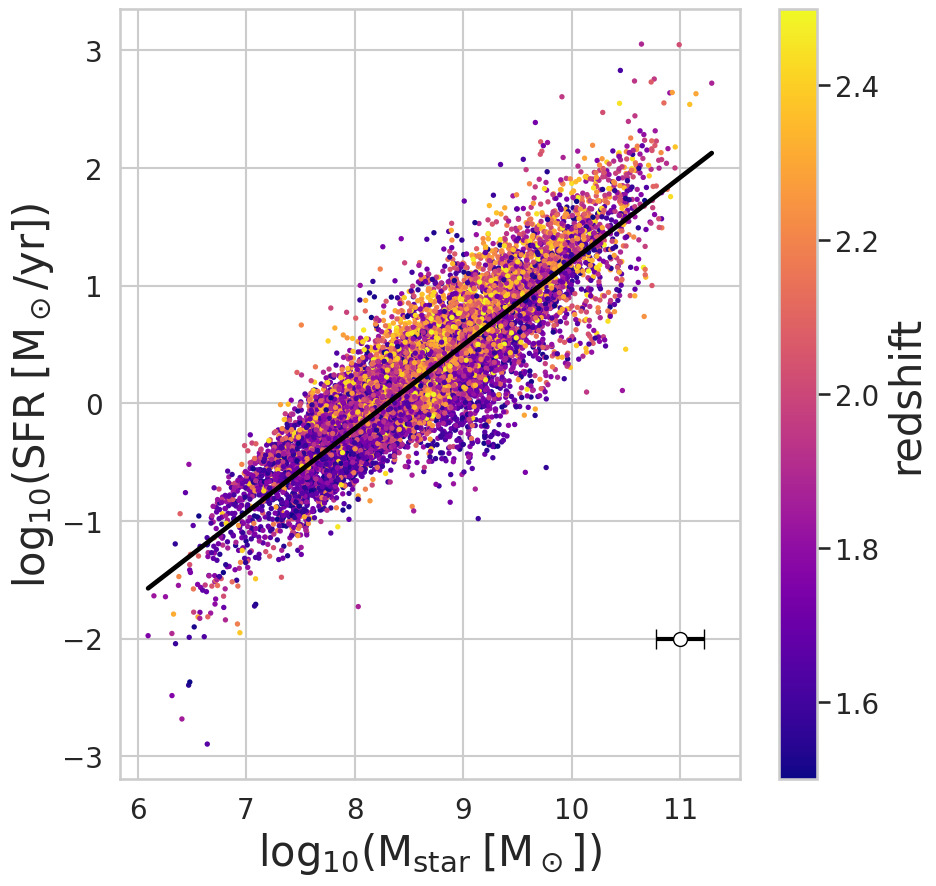

In [10]:
plt.figure(figsize = (10, 10))
sns.set_style('whitegrid')
sns.set_context('talk')

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

x = pd.DataFrame(df_mass["M_neb_med"])
x.columns = ['log(M)']
y = pd.DataFrame(df_phys["SFR_14a"])
y.columns = ['log(SFR)']
z = pd.DataFrame(df_reds['z_best'])
z.columns = ['B-V']

y = y[y > -90]
y = np.log10(y)

ax = sns.scatterplot(x = x['log(M)'], y = y['log(SFR)'], s = 15, edgecolor = 'none', data = z, hue = 'B-V', palette = 'plasma')
sns.regplot(x = x['log(M)'], y = y['log(SFR)'], scatter=False, ax=ax, color = 'k')

plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'redshift')
cb.set_label(label='redshift', fontsize = 30)


df_test2 = pd.concat([x, y], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['log(M)'])#.reshape((-1, 1))
y2 = np.array(df_test2['log(SFR)'])

p, V = np.polyfit(x2, y2, 1, cov=True)

print("pendiente: {} +/- {}".format(p[0], np.sqrt(V[0][0])))
print("intersección: {} +/- {}".format(p[1], np.sqrt(V[1][1])))
serr = df_mass['s_neb_med'].mean()
eb = plt.errorbar(x = 11, y = -2, xerr = serr, yerr = 0, ls = 'none', linewidth = 3, ecolor = 'black', capsize=7, zorder = 1)
eb2 = plt.scatter(x = 11, y = -2, color = 'white', edgecolors='black', linewidths=1, s = 100)

plt.xlabel('$\mathregular{log_{10}(M_{star} \; [M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR \; [M_\odot/yr])}$', size = 30)

del x, y, z
matplotlib.rcdefaults()

/var/folders/23/ld36njk96dbdd9x99njgz7kc0000gn/T/ipykernel_13368/3510081604.py:28: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = ax.figure.colorbar(sm, label = 'B-V')


Ajuste lineal:
 - Pendiente = -0.36998
 - Origen = -6.73625


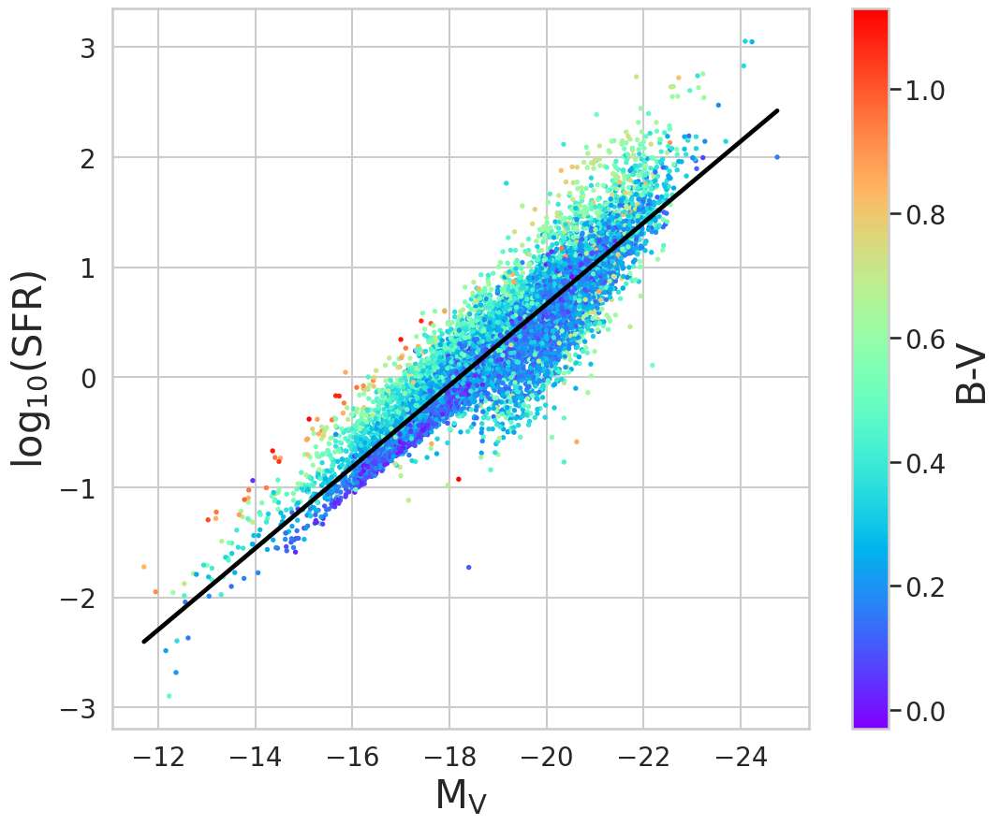

In [18]:
plt.figure(figsize = (12, 10))
#plt.grid()

sns.set_style("whitegrid")
sns.set_context('talk')

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

x = pd.DataFrame(df_phys["VMag_6a_tau^NEB"])
x.columns = ['M_V']
y = pd.DataFrame(df_phys["SFR_14a"])
y.columns = ['log(SFR)']
z = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
z.columns = ['B-V']

y = y[y > -90]
y = np.log10(y)

ax = sns.scatterplot(x = x['M_V'], y = y['log(SFR)'], s = 15, edgecolor = 'none', data = z, hue = 'B-V', palette = 'rainbow')
sns.regplot(x = x['M_V'], y = y['log(SFR)'], scatter=False, ax=ax, color = 'k')

plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

plt.xlabel('$\mathregular{M_V}$', size = 30)
plt.ylabel('$\mathregular{log_{10}(SFR)}$', size = 30)
plt.gca().invert_xaxis()

df_test2 = pd.concat([x, y], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['M_V'])#.reshape((-1, 1))
y2 = np.array(df_test2['log(SFR)'])

m, b = np.polyfit(x2, y2, 1)

print('Ajuste lineal:')
print(' - Pendiente =', '{:.5f}'.format(m))
print(' - Origen =', '{:.5f}'.format(b))
#plt.plot(x2, m*x2+b)


del x, y, z, df_test2
matplotlib.rcdefaults()

/var/folders/23/ld36njk96dbdd9x99njgz7kc0000gn/T/ipykernel_13368/536436809.py:23: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = ax.figure.colorbar(sm, label = 'B-V')


coefficient of determination: 0.8326030504327208
pendiente: -1.7828466495719266 +/- 0.006496036549048448
intersección: -3.431225994025544 +/- 0.05649961554961543


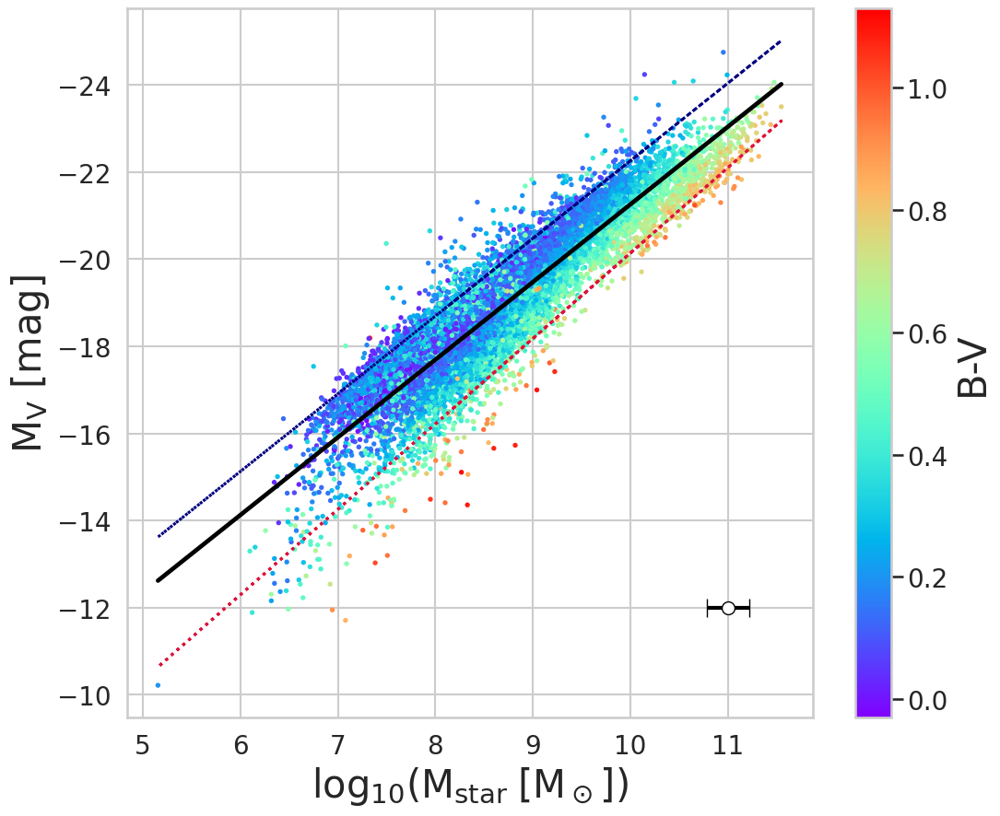

In [32]:
plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

x = pd.DataFrame(df_mass["M_neb_med"])
x.columns = ['log(M)']
y = pd.DataFrame(df_phys['VMag_6a_tau^NEB'])
y.columns = ['M_V']
z = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
z.columns = ['B-V']

ax = sns.scatterplot(x = x['log(M)'], y = y['M_V'], s = 15, edgecolor = 'none', data = z, hue = 'B-V', palette = 'rainbow')
sns.regplot(x = x['log(M)'], y = y['M_V'], scatter=False, ax=ax, color = 'k')

plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)


df_test2 = pd.concat([x, y], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['log(M)'])#.reshape((-1, 1))
y2 = np.array(df_test2['M_V'])

m, b = np.polyfit(x2, y2, 1)

plt.plot(x['log(M)'], x['log(M)']*m + b-1, linestyle = ':', color = 'navy')
plt.plot(x['log(M)'], x['log(M)']*m*1.1 + b+2.9, linestyle = ':', color = 'crimson')


from sklearn.linear_model import LinearRegression
x1 = pd.DataFrame(x['log(M)'])
y1 = pd.DataFrame(y['M_V'])
df1 = pd.concat([x1, y1], axis = 1)
df1 = df1.apply (pd.to_numeric, errors='coerce')
df1 = df1[df1['log(M)'].notna()]
df1 = df1[df1['M_V'].notna()]

x1 = np.array(df1['log(M)']).reshape(-1, 1)
y1 = np.array(df1['M_V'])
model = LinearRegression().fit(x1, y1) 
r_sq = model.score(x1, y1)
print('coefficient of determination:', r_sq)


p, V = np.polyfit(x2, y2, 1, cov=True)

print("pendiente: {} +/- {}".format(p[0], np.sqrt(V[0][0])))
print("intersección: {} +/- {}".format(p[1], np.sqrt(V[1][1])))
serr = df_mass['s_neb_med'].mean()
eb = plt.errorbar(x = 11, y = -12, xerr = serr, yerr = 0, ls = 'none', linewidth = 3, ecolor = 'black', capsize=7, zorder = 1)
eb2 = plt.scatter(x = 11, y = -12, color = 'white', edgecolors='black', linewidths=1, s = 100)

plt.xlabel('$\mathregular{log_{10}(M_{star} \; [M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V}$ $\mathregular{[mag]}$', size = 30)
plt.gca().invert_yaxis()

del x, y, z
matplotlib.rcdefaults()

/var/folders/23/ld36njk96dbdd9x99njgz7kc0000gn/T/ipykernel_13368/867361394.py:23: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = ax.figure.colorbar(sm, label = 'B-V')


pendiente: 0.4971347633008627 +/- 0.0032292924859826863
intersección: -2.4911244929916343 +/- 0.02808656706226733


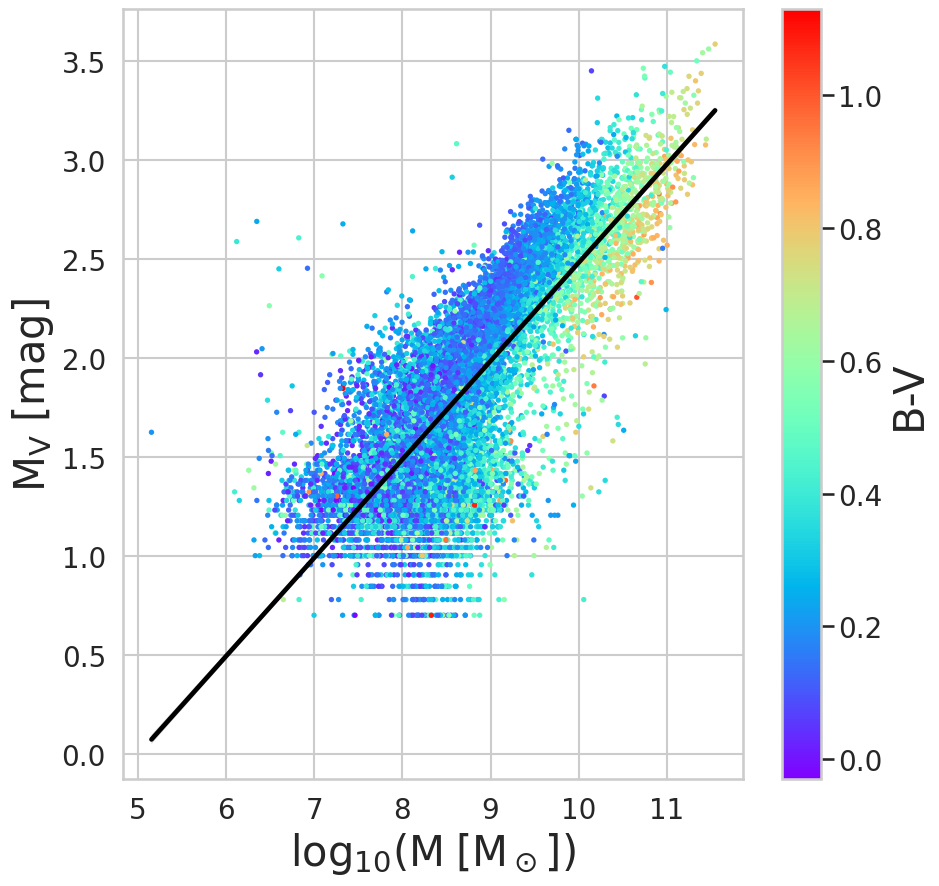

In [33]:
plt.figure(figsize = (10, 10))
sns.set_style('whitegrid')
sns.set_context('talk')

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

x = pd.DataFrame(df_mass["M_neb_med"])
x.columns = ['log(M)']
y = np.log10(df_mult[['ISOAREAF_IMAGE']])
y.columns = ['log(isoarea)']
z = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
z.columns = ['B-V']

ax = sns.scatterplot(x = x['log(M)'], y = y['log(isoarea)'], s = 15, edgecolor = 'none', data = z, hue = 'B-V', palette = 'rainbow')
sns.regplot(x = x['log(M)'], y = y['log(isoarea)'], scatter=False, ax=ax, color = 'k')

plt.legend([], [], frameon=False)
norm = plt.Normalize(z['B-V'].min(), z['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)


df_test2 = pd.concat([x, y], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['log(M)'])#.reshape((-1, 1))
y2 = np.array(df_test2['log(isoarea)'])

p, V = np.polyfit(x2, y2, 1, cov=True)

print("pendiente: {} +/- {}".format(p[0], np.sqrt(V[0][0])))
print("intersección: {} +/- {}".format(p[1], np.sqrt(V[1][1])))

plt.xlabel('$\mathregular{log_{10}(M \; [M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{M_V}$ $\mathregular{[mag]}$', size = 30)

del x, y, z
matplotlib.rcdefaults()

/var/folders/23/ld36njk96dbdd9x99njgz7kc0000gn/T/ipykernel_13368/1454673953.py:24: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = ax.figure.colorbar(sm, label = 'B-V')


Ajuste lineal:
 - Pendiente = -0.28782
 - Origen = 3.08441


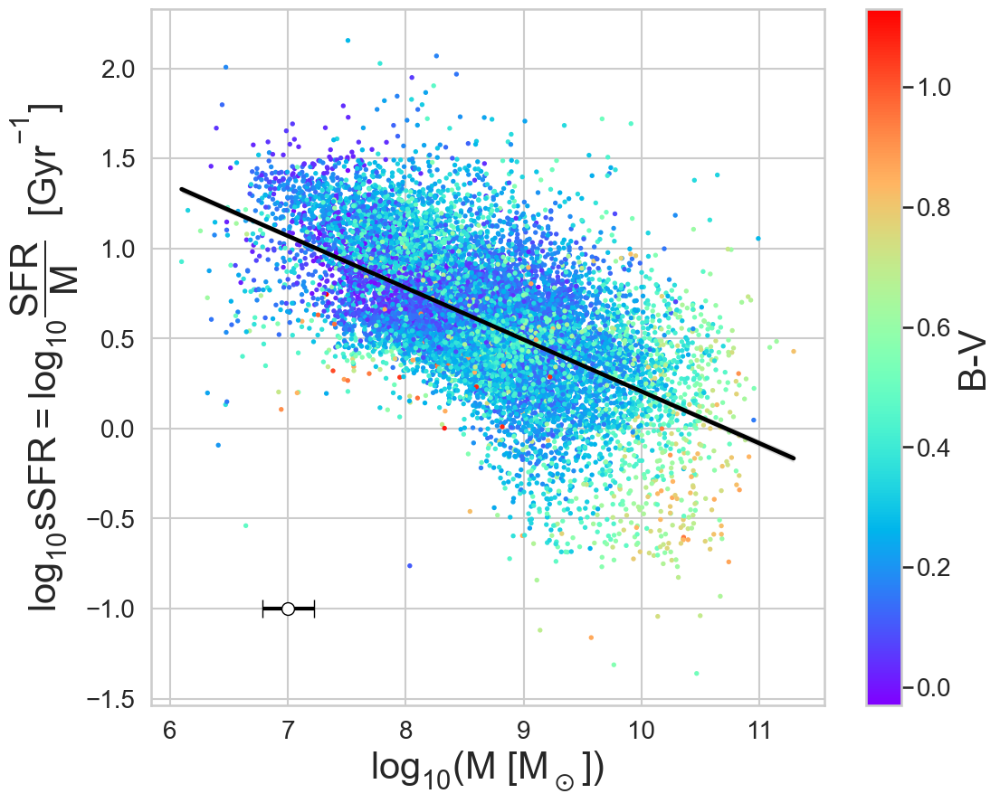

In [28]:
plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 


masa = df_mass['M_neb_med']
sfr = np.log10(df_phys['SFR_14a']*10**9)
sSFR = pd.DataFrame(sfr-masa)
sSFR.columns = ['sSFR']

color_BV = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
color_BV.columns = ['B-V']

ax = sns.scatterplot(x = masa, y = sSFR['sSFR'], s = 15, edgecolor = 'none', data = color_BV, hue = 'B-V', palette = 'rainbow', alpha = 1, zorder = 1)
sns.regplot(x = masa, y = sSFR['sSFR'], scatter=False, ax=ax, color = 'k')

plt.legend([], [], frameon=False)
norm = plt.Normalize(color_BV['B-V'].min(), color_BV['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='rainbow', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'B-V')
cb.set_label(label='B-V', fontsize = 30)

df_test2 = pd.concat([masa, sSFR], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['M_neb_med'])#.reshape((-1, 1))
y2 = np.array(df_test2['sSFR'])
m, b = np.polyfit(x2, y2, 1)
print('Ajuste lineal:')
print(' - Pendiente =', '{:.5f}'.format(m))
print(' - Origen =', '{:.5f}'.format(b))

serr = df_mass['s_neb_med'].mean()
eb = plt.errorbar(x = 7, y = -1, xerr = serr, yerr = 0, ls = 'none', linewidth = 3, ecolor = 'black', capsize=7, zorder = 1)
eb2 = plt.scatter(x = 7, y = -1, color = 'white', edgecolors='black', linewidths=1, s = 100)

plt.xlabel('$\mathregular{log_{10}(M \; [M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10} sSFR = log_{10} \dfrac{SFR}{M}}$  $\mathregular{[Gyr^{-1}]}$', size = 30)

plt.show()

/var/folders/23/ld36njk96dbdd9x99njgz7kc0000gn/T/ipykernel_13368/2753588886.py:24: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cb = ax.figure.colorbar(sm, label = 'redshift')


Ajuste lineal:
 - Pendiente = -0.28782
 - Origen = 3.08441


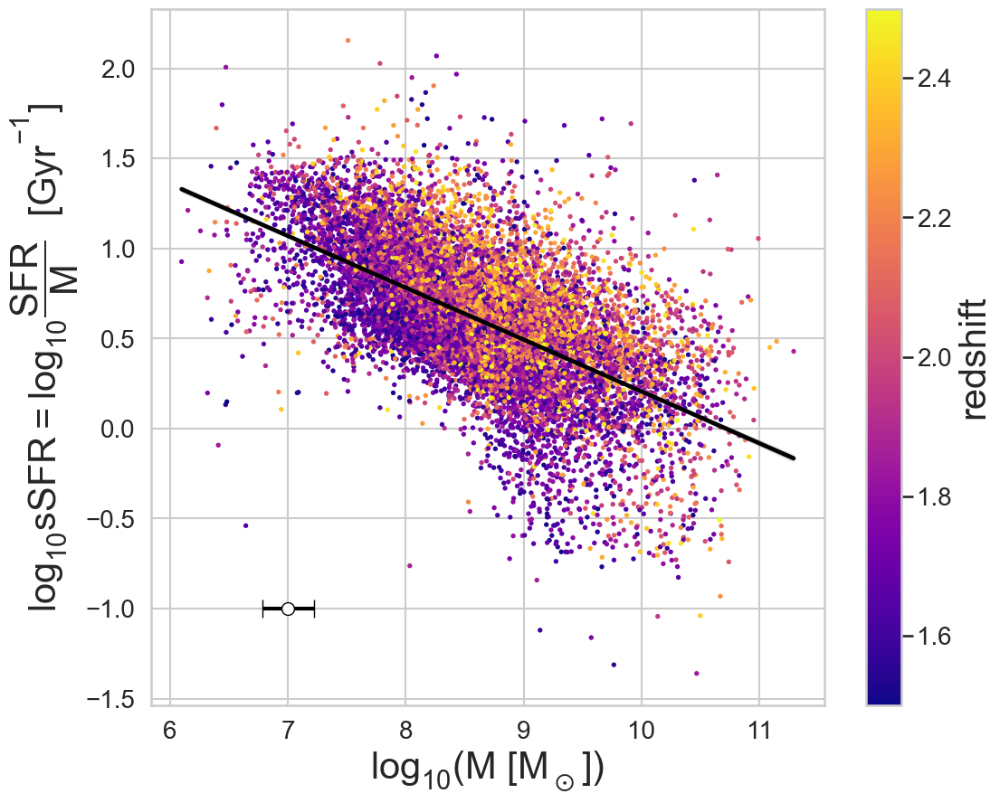

In [27]:
plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
sns.set_context('talk')
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 


masa = df_mass['M_neb_med']
sfr = np.log10(df_phys['SFR_14a']*10**9)
sSFR = pd.DataFrame(sfr-masa)
sSFR.columns = ['sSFR']

color_BV = pd.DataFrame(df_reds['z_best'])
color_BV.columns = ['B-V']

ax = sns.scatterplot(x = masa, y = sSFR['sSFR'], s = 15, edgecolor = 'none', data = color_BV, hue = 'B-V', palette = 'plasma', alpha = 1, zorder = 1)
sns.regplot(x = masa, y = sSFR['sSFR'], scatter=False, ax=ax, color = 'k')

plt.legend([], [], frameon=False)
norm = plt.Normalize(color_BV['B-V'].min(), color_BV['B-V'].max())
cmap = sns.cubehelix_palette(light=1, as_cmap=True)
sm = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
sm.set_array([])
cb = ax.figure.colorbar(sm, label = 'redshift')
cb.set_label(label='redshift', fontsize = 30)

df_test2 = pd.concat([masa, sSFR], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['M_neb_med'])#.reshape((-1, 1))
y2 = np.array(df_test2['sSFR'])
m, b = np.polyfit(x2, y2, 1)
print('Ajuste lineal:')
print(' - Pendiente =', '{:.5f}'.format(m))
print(' - Origen =', '{:.5f}'.format(b))

serr = df_mass['s_neb_med'].mean()
eb = plt.errorbar(x = 7, y = -1, xerr = serr, yerr = 0, ls = 'none', linewidth = 3, ecolor = 'black', capsize=7, zorder = 1)
eb2 = plt.scatter(x = 7, y = -1, color = 'white', edgecolors='black', linewidths=1, s = 100)

plt.xlabel('$\mathregular{log_{10}(M \; [M_\odot])}$', size = 30)
plt.ylabel('$\mathregular{log_{10} sSFR = log_{10} \dfrac{SFR}{M}}$  $\mathregular{[Gyr^{-1}]}$', size = 30)

plt.show()

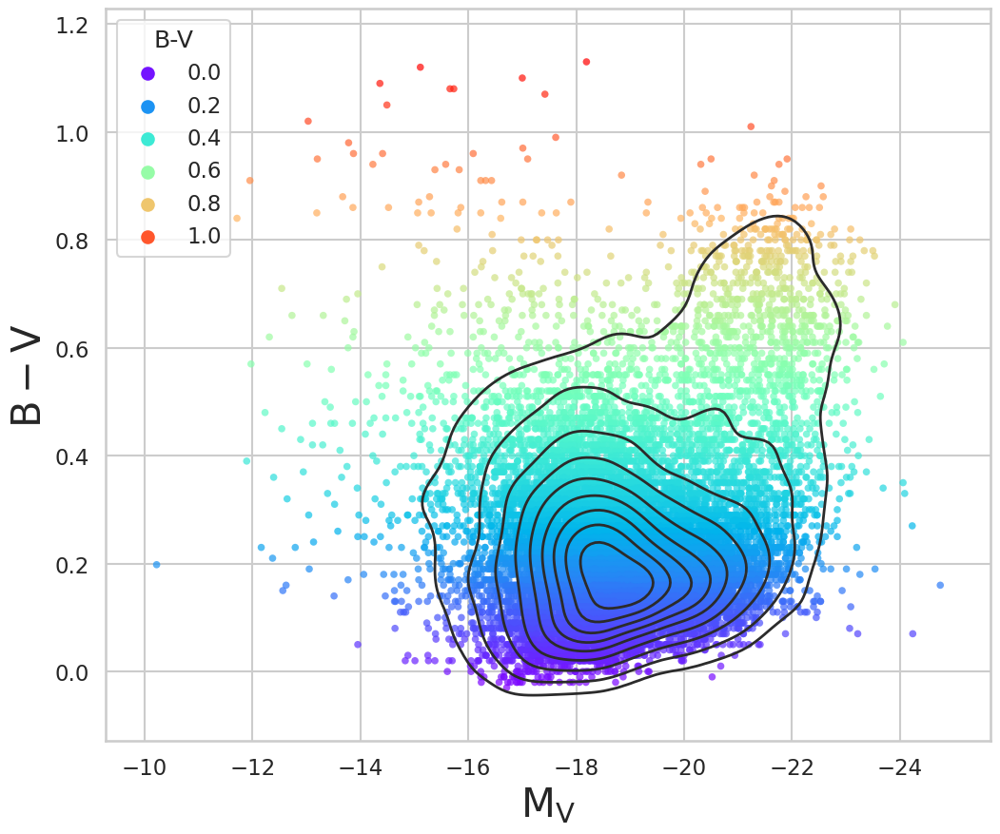

In [20]:
plt.figure(figsize = (12, 10))
sns.set_style('whitegrid')
matplotlib.rc('xtick', labelsize=25) 
matplotlib.rc('ytick', labelsize=25) 
sns.set_context('talk')

color_UR = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
color_UR.columns = ['U-R']

mag_R = pd.DataFrame(df_phys['VMag_6a_tau^NEB'])
mag_R.columns = ['Mag_R']

color_BV = pd.DataFrame(df_phys['BMag_6a_tau^NEB'] - df_phys['VMag_6a_tau^NEB'])
color_BV.columns = ['B-V']

sp = sns.scatterplot(x = mag_R['Mag_R'], y = color_UR['U-R'], s = 30, edgecolor = 'none', data = color_BV, hue = 'B-V', palette = 'rainbow', alpha = 0.7)
kdep = sns.kdeplot(x = mag_R['Mag_R'], y = color_UR['U-R'], color = '#2b2b2b', linewidths = 2)#, s = 10, edgecolor = 'none', data = color_BV, hue = 'B-V', palette = 'plasma')
#sp.colorbar(sp)
plt.xlabel('$\mathregular{M_V}$', size = 30)
plt.ylabel('$\mathregular{B-V}$', size = 30)
plt.gca().invert_xaxis()

matplotlib.rcdefaults()

Aquí podemos ver dos agrupaciones de galaxias, correspondiente a dos poblaciones diferentes, con caracterísiticas distintas.

---

Ajuste lineal:
 - Pendiente = 1.08637
 - Origen = -0.21139


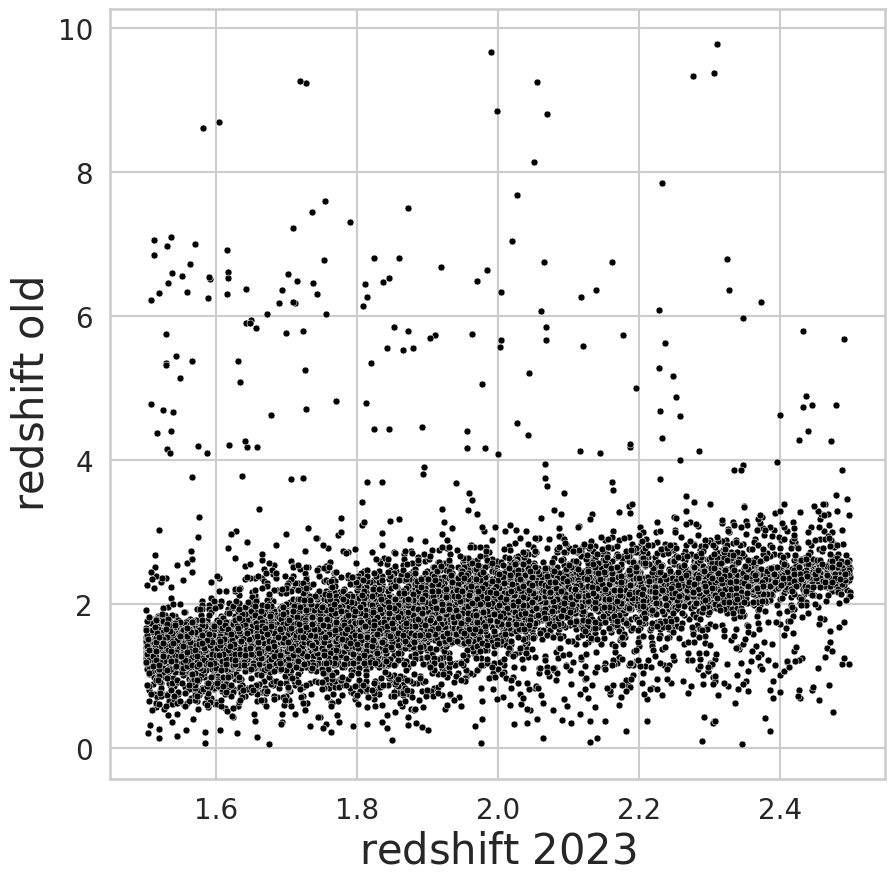

In [20]:
plt.figure(figsize = (10, 10))
#plt.grid()

sns.set_style("whitegrid")
sns.set_context('talk')

matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

x = pd.DataFrame(df_reds["z_best"])
x.columns = ['x']
y = pd.DataFrame(df_mass["zbest"])
y.columns = ['y']


ax = sns.scatterplot(x = x['x'], y = y['y'], s = 25, edgecolor = 'white', color= 'k')

plt.legend([], [], frameon=False)


plt.xlabel('$\mathregular{redshift}$ 2023', size = 30)
plt.ylabel('$\mathregular{redshift}$ old', size = 30)

df_test2 = pd.concat([x, y], axis = 1)
df_test2 = df_test2.dropna()
x2 = np.array(df_test2['x'])#.reshape((-1, 1))
y2 = np.array(df_test2['y'])

m, b = np.polyfit(x2, y2, 1)
print('Ajuste lineal:')
print(' - Pendiente =', '{:.5f}'.format(m))
print(' - Origen =', '{:.5f}'.format(b))

matplotlib.rcdefaults()